#### IMPORTS AND GLOBAL VARIABLES

In [255]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import requests
from shapely.geometry import Point, Polygon, LineString
import pandas as pd
import json
import geojson
import numpy as np
import folium
from folium.plugins import HeatMap, MarkerCluster
import re
from datetime import datetime
from matplotlib.patches import Patch

WWA_APIKEY = 'b5833d39-a485-48c4-8058-40e0209c8eeb'



#### HELPER FUNCTIONS

In [18]:
def getReqSaveToJSON(url, filepath):
    try:
        response = requests.get(url)
        if response.status_code == 200:
            data = response.json()
            data = data['result']
            # Save the AED data to a JSON file
            with open(filepath, 'w', encoding='utf-8') as f:
                json.dump(data, f, ensure_ascii=False, indent=4)
        else:
            print('Error:', response.status_code)
    except requests.exceptions.RequestException as e:
        print('Error:', e)

In [19]:
def process_feature_enom(feature):
    # Extract coordinates
    coords = [(float(p['longitude']), float(p['latitude'])) 
             for p in feature['geometry']['coordinates']]
    
    # Create polygon
    polygon = Polygon(coords)
    
    # Transform properties from key-value pairs to dictionary
    props = {}
    for prop in feature['properties']:
        props[prop['key']] = prop['value']
    
    return polygon, props


In [20]:
def create_geodataframe_enom(json_file):
    # Read JSON
    with open(json_file, 'r', encoding='utf-8') as f:
        data = json.load(f)
    
    polygons = []
    properties = []
    
    # Process each feature
    for feature in data['featureMemberList']:
        polygon, props = process_feature_enom(feature)
        polygons.append(polygon)
        properties.append(props)
    
    # Create GeoDataFrame
    gdf = gpd.GeoDataFrame(
        properties,
        geometry=polygons,
        crs="EPSG:4326"
    )
    
    return gdf

In [21]:
def process_feature_broutes(feature):
    # Extract coordinates
    coords = [(float(p['longitude']), float(p['latitude'])) 
             for p in feature['geometry']['coordinates']]
    
    # Create LineString
    line = LineString(coords)
    
    # Transform properties from key-value pairs to dictionary
    props = {}
    for prop in feature['properties']:
        props[prop['key']] = prop['value']
    
    return line, props


In [22]:
def create_broutes_gdf(json_file):
    # Read JSON
    with open(json_file, 'r', encoding='utf-8') as f:
        data = json.load(f)
    
    lines = []
    properties = []
    
    # Process each feature
    for feature in data['featureMemberList']:
        line, props = process_feature_broutes(feature)
        lines.append(line)
        properties.append(props)
    
    # Create GeoDataFrame
    gdf = gpd.GeoDataFrame(
        properties,
        geometry=lines,
        crs="EPSG:4326"
    )
    
    return gdf


#### GETTING DATA (API CALLS)

In [23]:
# GET AEDs
# aed_url= f'https://api.um.warszawa.pl/api/action/aed_get/?apikey={WWA_APIKEY}'
# aed_filepath = 'data/wwa_aed.json'
# getReqSaveToJSON(aed_url, aed_filepath)

In [24]:
#GET ENOMS
# enom_url = f'https://api.um.warszawa.pl/api/action/wfsstore_get?id=51ed1c43-6c3b-4c7c-9b1f-b5bd1b1dac0e&apikey={WWA_APIKEY}'
# enom_filepath = 'data/wwa_enom1.json'
# getReqSaveToJSON(enom_url, enom_filepath)

#### PROCESSING DATA

In [ ]:
bike_paths = gpd.read_file("data\\Trasy rowerowe Warszawa\\TrasyRowerowe_Warszawa.shp")
veturilo = gpd.read_file("data\\Stacje rowerowe VETURILO - Warszawa\\VETURILO_Warszawa.shp")

print(bike_paths.crs)
print(veturilo.crs)

default_crs = 4326

bike_paths = bike_paths.to_crs(epsg=3857)
veturilo = veturilo.to_crs(epsg=3857)

display(bike_paths.head())


In [28]:
# AEDs GDF

with open('data\\wwa_aed.json', 'r', encoding='utf-8') as f:
    aed_data = json.load(f)

# Lists to store data
points = []
properties = []

for aed in aed_data:
    # Extract coordinates
    coords = aed['geometry']['coordinates'][0]
    point = Point(coords[0], coords[1])
    props = aed['properties']
    
    points.append(point)
    properties.append(props)

# Create GeoDataFrame
aed_gdf = gpd.GeoDataFrame(
    properties,
    geometry=points,
    crs="EPSG:4326"
)
# display(aed_gdf.head())
aed_gdf = aed_gdf.set_geometry('geometry')
aed_gdf = aed_gdf.to_crs(epsg=3857)

In [ ]:
# Enom GDF

enom_gdf = create_geodataframe_enom('data\\wwa_enom1.json')
display(enom_gdf.head())
enom_gdf = enom_gdf.set_geometry('geometry')
enom_gdf = enom_gdf.to_crs(epsg=3857)

In [ ]:
# WWA DSITRICTS
#TODO maybe delete warsaw
city_districts = None
with open('data\\warszawa-dzielnice.geojson', 'r') as F:
    city_districts = geojson.loads(F.read())

districts_gdf = gpd.GeoDataFrame.from_features(city_districts['features'], crs='EPSG:4326')
districts_gdf = districts_gdf.to_crs(epsg=3857)

districts_pop_df = pd.read_csv('data\\dzielnice-pop.csv', sep=',')

districts_pop_gdf = districts_gdf.merge(districts_pop_df, on='cartodb_id')
districts_pop_gdf.drop(columns=['name'], inplace=True)

display(districts_pop_gdf)


In [94]:
# BIKES PER POPULATION
#TODO maybe delete warsaw
bikesperpop_gdf = districts_pop_gdf.copy()

district_bikes = []
for district in bikesperpop_gdf.iterrows():
    num_bikes = 0
    for bike in veturilo.iterrows():
        if bike[1].geometry.within(district[1].geometry):
            num_bikes += bike[1]['Ilość st']
    district_bikes.append(num_bikes)

bikesperpop_gdf['bikes'] = district_bikes
bikesperpop_gdf['pop_per_bikes'] = bikesperpop_gdf['population'] /  bikesperpop_gdf['bikes']
bikesperpop_gdf['bikes_per_pop'] = bikesperpop_gdf['bikes'] / bikesperpop_gdf['population']

display(bikesperpop_gdf)

,geometry,cartodb_id,district,population,bikes,pop_per_bikes,bikes_per_pop
0,"MULTIPOLYGON (((2340773.932 6866417.367, 23405...",1,Warszawa,2041039,8127,251.142980,0.003982
1,"MULTIPOLYGON (((2337878.958 6841468.228, 23366...",22,Ochota,80567,621,129.737520,0.007708
2,"MULTIPOLYGON (((2352450.345 6843472.708, 23525...",25,Rembertów,29418,154,191.025974,0.005235
3,"MULTIPOLYGON (((2323581.305 6839396.474, 23235...",2,Bemowo,142293,355,400.825352,0.002495
4,"MULTIPOLYGON (((2337288.63 6852247.714, 233746...",19,Białołęka,198270,241,822.697095,0.001216
5,"MULTIPOLYGON (((2366844.623 6838198.839, 23667...",31,Wesoła,33208,0,inf,0.000000
6,"MULTIPOLYGON (((2324033.485 6853471.098, 23239...",20,Bielany,136220,426,319.765258,0.003127
7,"MULTIPOLYGON (((2341144.849 6837614.439, 23411...",21,Mokotów,229379,760,301.814474,0.003313
8,"MULTIPOLYGON (((2348050.887 6839151.191, 23484...",23,Praga-Południe,191971,538,356.823420,0.002803
9,"MULTIPOLYGON (((2339170.152 6853614.706, 23391...",24,Praga-Północ,67152,613,109.546493,0.009129


In [73]:
# SCHOOLS
schools_df = pd.read_excel(
    'data/przedszkola-szkoly-i-placowki-oswiatowe_2021_2022.xlsx',
    engine='openpyxl',
    na_values=['-'],
    usecols='H,J,BQ,BR'
)
last_cols = schools_df.columns[-2:]
schools_df = schools_df.dropna(subset=last_cols)
allowed_school_types = ['szkoła podstawowa', 'liceum ogólnokształcące', 'technikum', 'szkoła branżowa I stopnia', 'szkoła podstawowa artystyczna']
schools_df = schools_df[schools_df['Typ jednostki'].isin(allowed_school_types)]
schools_geometry = [Point(xy) for xy in zip(schools_df[last_cols[0]], schools_df[last_cols[1]])]
schools_gdf = gpd.GeoDataFrame(schools_df, crs='EPSG:4326', geometry=schools_geometry)
schools_gdf = schools_gdf.to_crs(epsg=3857)
schools_gdf = schools_gdf.drop(columns=last_cols)


#### STATIC MAPS AND PLOTS

In [ ]:
# SCHOOLS AND BIKE PATHS

fig, ax = plt.subplots(figsize=(10, 10))
bike_paths.plot(ax=ax, color='black', linewidth=1, label='Trasy rowerowe')
schools_gdf.plot(ax=ax, color='#2164cf', markersize=8, label='Szkoły')
ctx.add_basemap(ax=ax, source=ctx.providers.OpenStreetMap.Mapnik)
plt.title('Drogi rowerowe a szkoły')
plt.axis('off')
plt.legend()
plt.show()



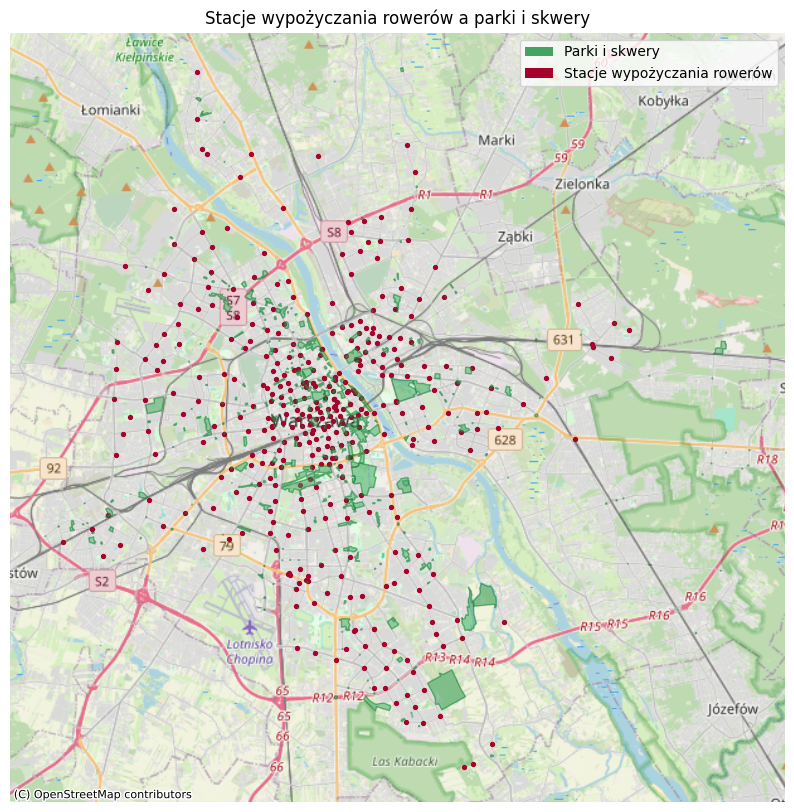

In [261]:
# PARKS AND VETURILO

fig, ax = plt.subplots(figsize=(10, 10))
veturilo.plot(ax=ax, color='#a6032c', markersize=8)
enom_gdf.plot(ax=ax, facecolor='#43a363', edgecolor='#017829', alpha=0.5)
ctx.add_basemap(ax=ax, source=ctx.providers.OpenStreetMap.Mapnik)
plt.title('Stacje wypożyczania rowerów a parki i skwery')
plt.axis('off')
legend_elements = [
    Patch(facecolor='#43a363', label='Parki i skwery'),
    Patch(facecolor='#a6032c', label='Stacje wypożyczania rowerów')
]
plt.legend(handles=legend_elements, 
          loc='upper right')

plt.show()

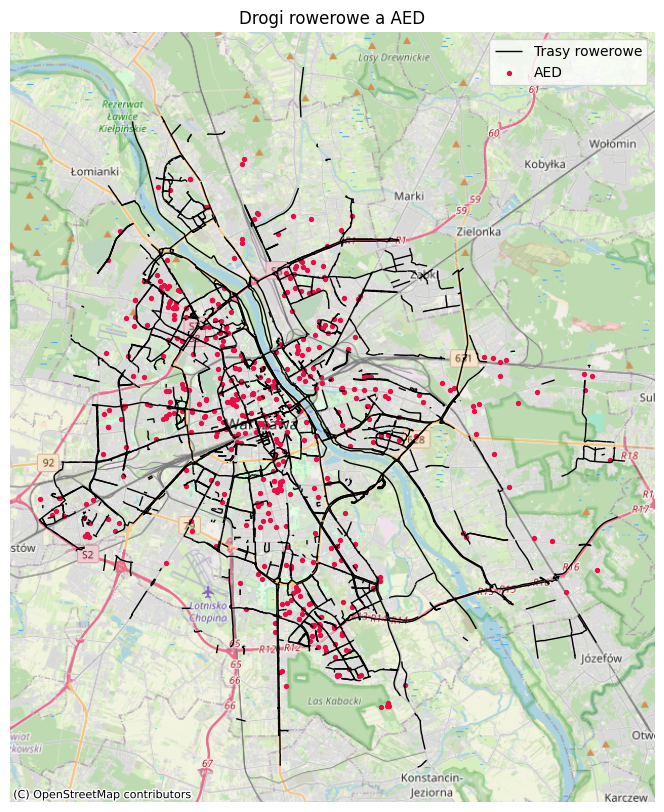

In [264]:
# AED AND BIKE PATHS

fig, ax = plt.subplots(figsize=(10, 10))
bike_paths.plot(ax=ax, color='black', linewidth=1, label='Trasy rowerowe')
aed_gdf.plot(ax=ax, color='#e80e44', markersize=8, label='AED')
ctx.add_basemap(ax=ax, source=ctx.providers.OpenStreetMap.Mapnik)
plt.title('Drogi rowerowe a AED')
plt.axis('off')
plt.legend()
plt.show()

In [ ]:
# DSITRICTS AND NUMBER OF BIKES

In [ ]:
# PLACE I SKWERY

fig, ax = plt.subplots(figsize=(15, 15))

# Plot polygons
enom_gdf.plot(
    ax=ax,
    edgecolor='black',
    # facecolor='none',
    linewidth=2,
    alpha=0.5,
    label='Locations',
    color='red',
)

# Add basemap
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik) 
# Add title and customize
plt.title('Warsaw Locations', pad=20, size=16)
plt.axis('off')

plt.show()

In [ ]:
# AEDS
fig, ax = plt.subplots(figsize=(12, 12))
aed_gdf.plot(
    ax=ax,
    color='green',
    markersize=20,
    alpha=0.6,
    label='AED Locations'
)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik) 
ax.legend()
plt.show()

In [ ]:
# VETURILO
fig, ax = plt.subplots(figsize=(12, 12))
veturilo.plot(ax=ax, color='red', markersize=20, label="Stacje Veturilo")
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik) 
ax.legend()
plt.show()

In [ ]:
fig, ax = plt.subplots(figsize=(12, 12))
bike_paths.plot(ax=ax, color='blue', edgecolor='black', label="Trasy Rowerowe")
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
ax.legend()
plt.show()

In [ ]:

fig, ax = plt.subplots(figsize=(15, 15))
districts_pop_gdf.plot(
    ax=ax,
    edgecolor='black',
    # facecolor='none',
    linewidth=2,
    alpha=0.5,
    label='Locations',
    color='red',
)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik) 
plt.title('Warsaw Locations', pad=20, size=16)
plt.show()

In [ ]:

# Plot
fig, ax = plt.subplots(figsize=(12, 12))
aed_gdf.plot(
    ax=ax,
    color='green',
    markersize=20,
    alpha=0.6,
    label='AED Locations'
)
bike_paths.plot(ax=ax, color='blue', edgecolor='black', label="Trasy Rowerowe")
veturilo.plot(ax=ax, color='red', markersize=20, label="Stacje Veturilo")
enom_gdf.plot(
    ax=ax,
    edgecolor='black',
    facecolor='none',
    linewidth=2,
    alpha=0.7,
    label='Locations'
)
districts_pop_gdf.plot(
    ax=ax,
    edgecolor='black',
    facecolor='none',
    linewidth=2,
    alpha=0.5,
    label='Locations',
    # color='red',
)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik) 

ax.set_title("Mapa Warszawy: Ścieżki Rowerowe i Stacje Veturilo", fontsize=16)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.legend()
plt.show()

In [ ]:
fig, ax = plt.subplots(figsize=(12, 12))

veturilo.plot(ax=ax, color='red', markersize=20, label="Stacje Veturilo")
districts_pop_gdf.plot(
    ax=ax,
    edgecolor='black',
    facecolor='none',
    linewidth=2,
    alpha=0.5,
    label='Locations',
    # color='red',
)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik) 

ax.legend()
plt.show()

In [ ]:
fig, ax = plt.subplots(figsize=(12, 12))

schools_gdf.plot(
    ax=ax,
    edgecolor='black',
    # facecolor='none',
    linewidth=2,
    alpha=0.5,
    label='Locations',
    color='red',
)
districts_pop_gdf.plot(
    ax=ax,
    edgecolor='blue',
    facecolor='none',
    linewidth=2,
    alpha=0.5,
    label='Locations',
    # color='red',
)


ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik) 

ax.legend()
plt.show()

#### DYNAMIC MAP

In [180]:
def districts_style_function(feature):
    return {
        'fillColor': '#399fe3',
        'color': '#345eeb',
        'weight': 1,
        'fillOpacity': 0.1
    }

def districts_highlight_function(feature):
    return {
        'fillOpacity': 0.3,
        'weight': 2
    }

def enom_style_function(feature):
    return {
        'fillColor': '#2ab54c',
        'color': '#01731e',
        'weight': 1,
        'fillOpacity': 0.1
    }

def enom_highlight_function(feature):
    return {
        'fillOpacity': 0.3,
        'weight': 2
    }


fm_bikepaths = bike_paths.copy()
fm_bikepaths = fm_bikepaths.to_crs(epsg=4326)
fm_bikepaths['MATE_NAWIE'] = fm_bikepaths['MATE_NAWIE'].fillna('inny')

fm_veturilo = veturilo.copy()
fm_veturilo = fm_veturilo.to_crs(epsg=4326)

fm_aed = aed_gdf.copy()
fm_aed = fm_aed.to_crs(epsg=4326)
fm_aed['device_access_description'] = fm_aed['device_access_description'].fillna('Brak danych')

fm_enom = enom_gdf.copy()
fm_enom = fm_enom.to_crs(epsg=4326)

fm_schools = schools_gdf.copy()
fm_schools = fm_schools.to_crs(epsg=4326)

fm_districts = districts_pop_gdf.copy()
fm_districts = fm_districts.to_crs(epsg=4326)

fm_bikesperpop = bikesperpop_gdf.copy()
fm_bikesperpop = fm_bikesperpop.to_crs(epsg=4326)
fm_bikesperpop['pop_per_bikes'] = np.ceil(fm_bikesperpop['pop_per_bikes'])
fm_bikesperpop['pop_per_bikes'] = fm_bikesperpop['pop_per_bikes'].replace([np.inf, -np.inf], '-')

In [179]:

fm = folium.Map(location=[52.2297, 21.0122], zoom_start=10)

# Districts layer
folium.GeoJson(
    fm_bikesperpop,
    name='Dzielnice',
    style_function=districts_style_function,
    highlight_function=districts_highlight_function,
    popup=folium.GeoJsonPopup(
        fields=['district', 'population', 'bikes', 'pop_per_bikes'],
        aliases=['Dzielnica:', 'Liczba mieszkańców:','Liczba rowerów:', 'Liczba mieszkańców na jeden rower:'],
        localize=True
    )
).add_to(fm)

# Veturilo heatmap
heat_group = folium.FeatureGroup(
    name='Mapa ciepła ilości rowerów',
    show=False)
heat_data = [
    [row.geometry.y, row.geometry.x, row["Ilość st"]]
    for _, row in fm_veturilo.iterrows()
    if row["Ilość st"] > 0
]
HeatMap(
    heat_data,
    radius=15,
    blur=15,
    min_opacity=0.5
    ).add_to(heat_group)
heat_group.add_to(fm)

# Veturilo markers
with open('icons\\bike.svg', 'r') as f:
    bike_icon = f.read()
veturilo_marker_cluster = MarkerCluster(
    name='Stacje Veturilo',
    show=False)
for idx, row in fm_veturilo.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=folium.Popup(
            f"Lokalizacja: {row['Lokalizacj']}<br>"
            f"Liczba stojaków: {row['Ilość st']}"
        ),
         icon=folium.DivIcon(
            html=bike_icon,
            icon_size=(35, 35),
            icon_anchor=(15, 15),
            popup_anchor=(0, -15),
            class_name='bike-icon'
        )
    ).add_to(veturilo_marker_cluster)
veturilo_marker_cluster.add_to(fm)

# Bike paths
#TODO Change colors
unique_surface = fm_bikepaths['MATE_NAWIE'].unique()
surface_colors = {
    'kostka prefabrykowana': 'blue',
    'masa bitumiczna': 'black',
    'grunt naturalny': 'brown',
    'kostka kamienna': 'gray',
    'płyty betonowe': 'green',
    'beton': 'red',
    'inny': 'yellow',
    'bruk': 'orange',
}
all_surfaces_layer = folium.FeatureGroup(name="Wszystkie trasy rowerowe", show=False)
surface_layers = {} 
for surface_type in unique_surface:
    surface_layer = folium.FeatureGroup(name=f"Nawierzchnia: {surface_type}", show=False)
    for _, row in fm_bikepaths.iterrows():
        if row.geometry.geom_type == 'LineString' and row["MATE_NAWIE"] == surface_type:
            folium.PolyLine(
                locations=[(point[1], point[0]) for point in row.geometry.coords],
                color=surface_colors.get(surface_type, 'gray'),
                weight=3, opacity=1
            ).add_to(surface_layer)

            folium.PolyLine(
                locations=[(point[1], point[0]) for point in row.geometry.coords],
                color='black',
                weight=2, opacity=1
            ).add_to(all_surfaces_layer)
    
    surface_layers[surface_type] = surface_layer
    surface_layer.add_to(fm)
all_surfaces_layer.add_to(fm)

# Schools markers
with open('icons\\school.svg', 'r') as f:
    school_icon = f.read()
school_marker_cluster = MarkerCluster(
    name='Szkoły',
    show=False)
for idx, row in fm_schools.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=folium.Popup(
            f"{row['Nazwa szkoły/ jednostki']}"
        ),
         icon=folium.DivIcon(
            html=school_icon,
            icon_size=(35, 35),
            icon_anchor=(15, 15),
            popup_anchor=(0, -15),
            class_name='school-icon'
        )
    ).add_to(school_marker_cluster)
school_marker_cluster.add_to(fm)

# AEDs markers
with open('icons\\aed.svg', 'r') as f:
    aed_icon = f.read()
aed_marker_cluster = MarkerCluster(
    name='Defibrylatory',
    show=False)
for idx, row in fm_aed.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=folium.Popup(
            f"Ulica: {row['location_street']}<br>"
            f"Dostępność: {row['device_location']}, {row['device_public_access']}<br>"
            f"Godziny dostępności: {row['device_access_description']}<br>"
        ),
        icon=folium.DivIcon(
            html=aed_icon,
            icon_size=(35, 35),
            icon_anchor=(15, 15),
            popup_anchor=(0, -15),
            class_name='aed_icon'
        )
    ).add_to(aed_marker_cluster)
aed_marker_cluster.add_to(fm)

# squares layer
folium.GeoJson(
    fm_enom,
    name='Place i skwery',
    show=False,
    style_function=enom_style_function,
    highlight_function=enom_highlight_function,
    popup=folium.GeoJsonPopup(
        fields=['NAZWA_PODST', 'DZIELNICE'],
        aliases=['Nazwa:', 'Dzielnica:'],
        localize=True
    )
).add_to(fm)

# SHOW MAP
folium.LayerControl().add_to(fm)
# fm.save('dynamic_map.html')
fm

#### TIMELAPSE

In [182]:
def extract_year(label_dict):
    if not label_dict or '_label_' not in label_dict:
        return None
        
    text = label_dict['_label_']
    year_match = re.search(r'Rok budowy/remontu: (.*?)(?:\n|$)', text)
    
    if not year_match:
        return None
        
    year_value = year_match.group(1)

    if year_value == 'brak danych':
        return None

    if year_value.isdigit():
        return int(year_value)
        
    return None

def process_message_json(json_file):
    with open(json_file, 'r', encoding='utf-8') as f:
        data = json.load(f)
    
    i = 0
    lines = []
    ids = []
    years = []
    for item in data:
        _id = item['_id']
        geometry = item['geometry']
        properties = item['properties']
        year = extract_year(properties)
        if not year:
            continue
        if geometry['type'] != 'LineString':
            continue

        coords1 = []
        coords2 = []
        for index, coord in enumerate(geometry['coordinates']):
            if index % 2 == 0:
                coords1.append(coord)
            else:
                coords2.append(coord)
        
        coords = list(zip(coords1, coords2))
        lines.append(LineString(coords))
        ids.append(_id)
        years.append(year)

    gdf = gpd.GeoDataFrame({'id': ids, 'year': years}, geometry=lines, crs='EPSG:2178')
    return gdf

In [193]:
timelapse_gdf = process_message_json('data/broutes_date.json')
timelapse_gdf = timelapse_gdf.to_crs(epsg=4326)
display(timelapse_gdf.head())


,id,year,geometry
0,ABeSwIAABAAP8o+AAA,2021,"LINESTRING (21.03491 52.37838, 21.03519 52.379..."
1,ABeSwIAABAAP8hXAAA,2021,"LINESTRING (21.03866 52.42048, 21.03863 52.420..."
2,ABeSwIAABAAP8VkAAA,2020,"LINESTRING (21.09871 52.33907, 21.0987 52.3390..."
3,ABeSwIAABAAP8R9AAB,2021,"LINESTRING (21.15644 52.33307, 21.15646 52.333..."
4,ABeSwIAABAAP8VBAAB,2022,"LINESTRING (21.0559 52.34089, 21.05586 52.3408..."


In [234]:
m = folium.Map(location=[35.68159659061569, 139.76451516151428], zoom_start=16)

# Lon, Lat order.
lines = [
    {
        "coordinates": [
            [139.76451516151428, 35.68159659061569],
            [139.75964426994324, 35.682590062684206],
        ],
        "dates": ["2017-06-02T00:00:00", "2017-06-02T00:10:00"],
        "color": "red",
    },
    {
        "coordinates": [
            [139.75964426994324, 35.682590062684206],
            [139.7575843334198, 35.679505030038506],
        ],
        "dates": ["2017-06-02T00:10:00", "2017-06-02T00:20:00"],
        "color": "blue",
    },
    {
        "coordinates": [
            [139.7575843334198, 35.679505030038506],
            [139.76337790489197, 35.678040905014065],
        ],
        "dates": ["2017-06-02T00:20:00", "2017-06-02T00:30:00"],
        "color": "green",
        "weight": 15,
    },
    {
        "coordinates": [
            [139.76337790489197, 35.678040905014065],
            [139.76451516151428, 35.68159659061569],
        ],
        "dates": ["2017-06-02T00:30:00", "2017-06-02T00:40:00"],
        "color": "#FFFFFF",
    },
]

features = [
    {
        "type": "Feature",
        "geometry": {
            "type": "LineString",
            "coordinates": line["coordinates"],
        },
        "properties": {
            "times": line["dates"],
            "style": {
                "color": line["color"],
                "weight": line["weight"] if "weight" in line else 5,
            },
        },
    }
    for line in lines
]

print(features[0])

# folium.plugins.TimestampedGeoJson(
#     {
#         "type": "FeatureCollection",
#         "features": features,
#     },
#     period="PT1M",
#     add_last_point=False,
# ).add_to(m)

# m

{'type': 'Feature', 'geometry': {'type': 'LineString', 'coordinates': [[139.76451516151428, 35.68159659061569], [139.75964426994324, 35.682590062684206]]}, 'properties': {'times': ['2017-06-02T00:00:00', '2017-06-02T00:10:00'], 'style': {'color': 'red', 'weight': 5}}}


In [235]:
from folium.plugins import TimestampedGeoJson
from datetime import datetime, timedelta

features = []
end_time = "2025"
print(end_time)
for _, row in timelapse_gdf.iterrows():
    feature = {
        'type': 'Feature',
        'geometry': {
            'type': 'LineString',
            'coordinates': [[p[0], p[1]] for p in row.geometry.coords]
        },
        'properties': {
            'times': [str(row['year']), end_time], # Use actual year from data
            'style': {
                'color': '#3388ff',
                'weight': 2,
                'opacity': 0.8
            }
        }
    }
    features.append(feature)

print(features[0])

fm_anim = folium.Map(location=[52.2297, 21.0122], zoom_start=11)

# Add timestamped layer
TimestampedGeoJson(
    {'type': 'FeatureCollection', 'features': features},
    period='P1Y',          # 1 year per step
    # duration='P1Y',        # Show 1 year at a time
    # auto_play=True,
    # loop=True,
    # max_speed=1,
    # loop_button=True,
    # time_slider_drag_update=True,
    # date_options='YYYY',   # Year format
    add_last_point=False,
).add_to(fm_anim)

fm_anim

2025
{'type': 'Feature', 'geometry': {'type': 'LineString', 'coordinates': [[21.034910295106023, 52.378380946836785], [21.035188064407095, 52.37972283272972], [21.035445581599177, 52.38104132396105], [21.036023142004986, 52.38404805346037], [21.036518847010232, 52.386667199855026], [21.03684857745279, 52.38826507170139], [21.03725334510422, 52.39007062140675], [21.037720567929565, 52.391031159533185], [21.03843236066045, 52.392314845689164], [21.039012982276418, 52.39330404645136], [21.040398553776416, 52.395282021863295], [21.041161753676512, 52.3966990072702], [21.04127708305581, 52.39695857036069], [21.041356457836724, 52.39705816127614], [21.041411981906165, 52.39719725133269], [21.041432482361106, 52.39729652307574], [21.04142186464942, 52.39737380894637], [21.041411350109428, 52.397564488483916], [21.04143877988486, 52.397610678837275], [21.04160592333307, 52.39777977644107], [21.04163803978525, 52.39782851303786], [21.042097063542005, 52.39918124035881], [21.042284365539267, 52.